# Pipeline for image size estimation

Imports

In [8]:
# basics
import numpy as np
import pandas as pd
import math
from tqdm import tqdm
# file work
import os
import json
# computer vision
import cv2
import torch
import laser_detection as ld
# models
from segment_anything import sam_model_registry, SamPredictor
from easy_ViTPose import VitInference
from huggingface_hub import hf_hub_download

## Step 0: Assign input point to each image

run: 'python3 label.py' to get json of image names and input points (change path to folder in script)

## Step 1: Load image data from json

The below are modifiable parameters you can change depending on what dataset you are running

In [9]:
# ALL DATA
# json_file = '../data/red_laser_data.json'
# image_folder = '../data/red_laser_data'
# mask_folder = '../data/red_laser_data_masks'

# SAMPLE DATA
json_file = 'sample_data/red_lasers/sample_data.json'
image_folder = 'sample_data/red_lasers/sample_data'
mask_folder = 'sample_data/red_lasers/sample_data_masks'

# load data
with open(json_file, 'r') as file:
    image_data = json.load(file)

In [10]:
len(image_data)

8

Some helper functions for displaying images

In [11]:
# function to show mask
def show_mask(mask, ax):
    color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

# function to show input point
def show_points(points, ax):
    ax.scatter(points[:, 0], points[:, 1], color='blue', marker='*', s=250, edgecolor='white', linewidth=1.25)

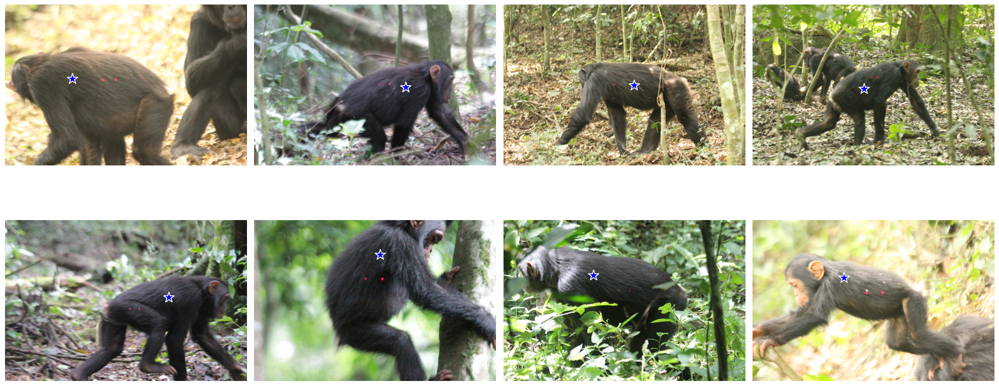

In [12]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Looks good!

## Step 2: Run images through SAM to prep for laser detection

### ***only need to run this code once to get masks!!!

Set up SAM

### let's visualize labels from json

In [16]:
# select checkpoint and model type
sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# define predictor
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)

# change device if cuda is available
if torch.cuda.is_available():
    sam.to(device='cuda')

predictor = SamPredictor(sam)

In [17]:
def generate_mask(im, input_point):
    input_label = np.array([1])
    predictor.set_image(im)
    masks, scores, _ = predictor.predict(point_coords=input_point, point_labels=input_label, multimask_output=True)
    # return best mask
    return masks[np.argmax(scores)]

Iterate through images and get mask

In [18]:
from tqdm import tqdm
# iterate through each entry in the JSON data
for image_name, im_data in tqdm(image_data.items(), desc="Processing Images"):
    image_path = os.path.join(image_folder, image_name)
    
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    if img is not None:
        # extract coordinates
        input_point = np.array([im_data['input_point']])
        # Generate the mask
        mask = generate_mask(img, input_point)
        mask = mask.astype(np.uint8)
        
        # Define the mask filename
        mask_filename = os.path.splitext(image_name)[0] + "_mask.png"
        mask_path = os.path.join(mask_folder, mask_filename)
        
        # Save the mask
        cv2.imwrite(mask_path, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['mask'] = mask_filename

Processing Images: 100%|██████████| 8/8 [00:04<00:00,  1.69it/s]

Updated data saved to sample_data/red_lasers/sample_data.json


viewing masks: 100%|██████████| 8/8 [00:02<00:00,  2.82it/s]


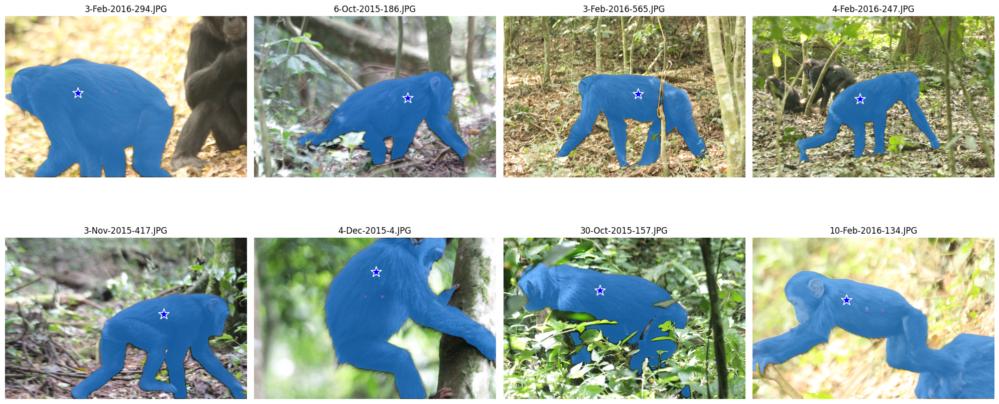

In [20]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, im_data in tqdm(image_data.items(), desc="viewing masks"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = im_data['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        input_point = np.array([im_data['input_point']])

        # plot image
        axs[idx].imshow(img)
        show_points(input_point, axs[idx])
        show_mask(mask, axs[idx])
        axs[idx].axis('off')
        axs[idx].set_title(image_name)

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

Good stuff

## Step 3: laser point detection

In [33]:
import laser_detection as ld
import importlib
importlib.reload(ld)
import cProfile
import pstats

In [34]:
profile = cProfile.Profile()
profile.enable()

idx = 0
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="detecting lasers"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    source = cv2.imread(image_path)

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    mask = mask > 0  # need to convert to boolean values

    if source is not None:
        # run laser detection image
        points = ld.detect_laser_points(source, mask)
        
        # Update the JSON data with the mask filename
        image_data[image_name]['laser_points'] = points

profile.disable()
ps = pstats.Stats(profile).sort_stats('cumulative')
ps.print_stats()

detecting lasers: 100%|██████████| 8/8 [00:52<00:00,  6.53s/it]

         83758 function calls in 52.249 seconds

   Ordered by: cumulative time

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
        3    0.000    0.000   52.248   17.416 /cluster/tufts/fuzzywuzzy/jbrand12/condaenv/fzwz/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3514(run_code)
        3    0.000    0.000   52.248   17.416 {built-in method builtins.exec}
        1    0.007    0.007   52.248   52.248 /tmp/ipykernel_46615/2870158647.py:6(<module>)
        8    0.668    0.083   51.256    6.407 /cluster/tufts/fuzzywuzzy/jbrand12/fuzzy-wuzzy/laser_detection.py:27(detect_laser_points)
        8    1.443    0.180   50.166    6.271 /cluster/tufts/fuzzywuzzy/jbrand12/condaenv/fzwz/lib/python3.9/site-packages/skimage/feature/blob.py:401(blob_log)
       40    0.000    0.000   42.734    1.068 /cluster/tufts/fuzzywuzzy/jbrand12/condaenv/fzwz/lib/python3.9/site-packages/scipy/ndimage/_filters.py:549(gaussian_laplace)
       40    0.318    0.008   42.734 

let's checkout the results

In [35]:
def draw_dots(points, ax, color):
    ax.scatter(points[:, 0], points[:, 1], color=color, s=10)

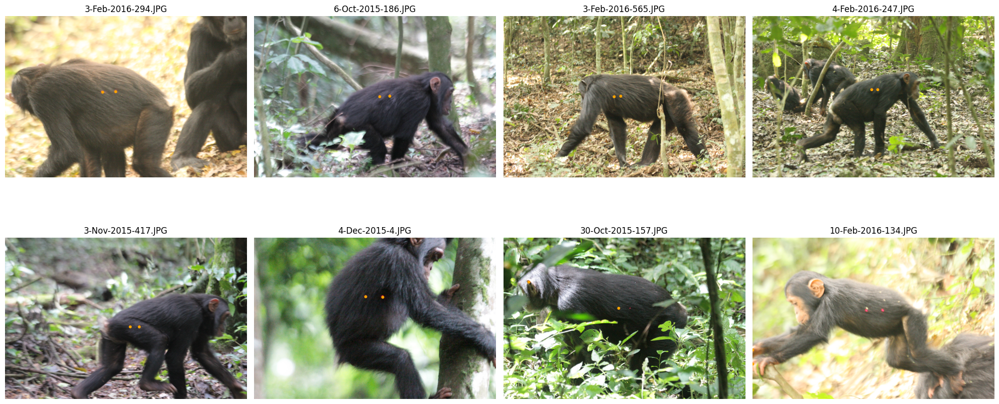

In [36]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # Load the mask
    mask_filename = info['mask']
    mask_path = os.path.join(mask_folder, mask_filename)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Load mask in grayscale

    if img is not None:
        # extract coordinates
        points = np.array(info['laser_points'])

        # plot image
        axs[idx].imshow(img)
        if len(points == 2):
            draw_dots(points, axs[idx], "orange")
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} - {len(points)} point/s detected")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 4: Run VitPose

In [17]:
# define model parameters
MODEL_SIZE = 'b'
YOLO_SIZE = 'n'
DATASET = 'apt36k'
ext = '.pth'
ext_yolo = '.pt'

# download model_path and yolo_path
MODEL_TYPE = "torch"
YOLO_TYPE = "torch"
REPO_ID = 'JunkyByte/easy_ViTPose'
FILENAME = os.path.join(MODEL_TYPE, 
                        f'{DATASET}/vitpose-' + MODEL_SIZE + f'-{DATASET}') + ext
FILENAME_YOLO = 'yolov8/yolov8' + YOLO_SIZE + ext_yolo
print(f'Downloading model {REPO_ID}/{FILENAME}')
model_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME)
yolo_path = hf_hub_download(repo_id=REPO_ID, filename=FILENAME_YOLO)

In [18]:
# initialize model
model = VitInference(model_path, yolo_path, MODEL_SIZE, dataset=DATASET, device='cuda')

In [19]:
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="ViTPose"):
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    # get keypoints
    img_arr = np.array(img, dtype=np.uint8)
    keypoints = model.inference(img_arr)

    if keypoints:
      # store results
      shoulder = keypoints[0][3]
      shoulder = [int(shoulder[1]), int(shoulder[0])]
      rump = keypoints[0][4]
      rump = [int(rump[1]), int(rump[0])]
      # Update the JSON data with shoulder and rump
      image_data[image_name]['shoulder_rump'] = [shoulder, rump]
    else:
      print(f"vitpose failed for {image_path}")
      # TODO how do we want to handle this case in the json?
      image_data[image_name]['shoulder_rump'] = None

ViTPose:  75%|███████▌  | 6/8 [00:01<00:00,  5.42it/s]

vitpose failed for red_lasers/new_sample_data/3-Nov-2015-417.JPG


ViTPose: 100%|██████████| 8/8 [00:01<00:00,  4.21it/s]


In [20]:
if image_data['3-Nov-2015-417.JPG']['shoulder_rump'] is None:
    print("yes")

yes


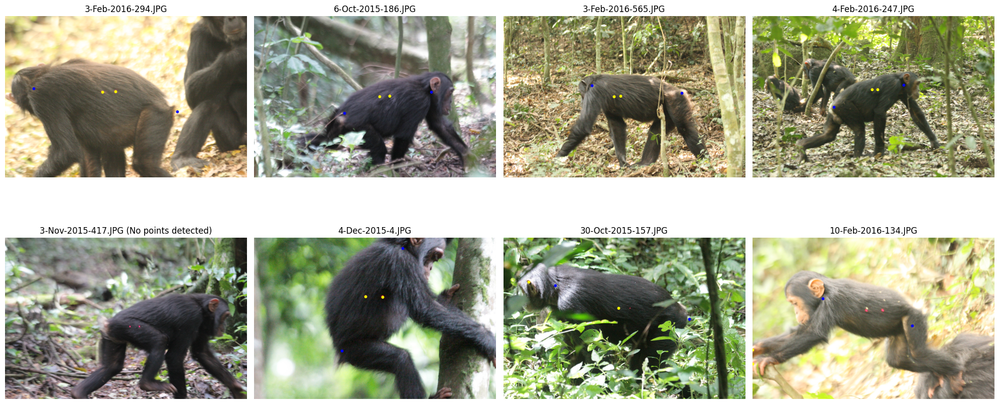

In [21]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

# flatten axes for easy indexing
axs = axs.flatten()

idx = 0
# iterate through each entry in json
for image_name, info in image_data.items():
    image_path = os.path.join(image_folder, image_name)
    # load image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting

    if img is not None:
        # extract coordinates
        points1 = info['shoulder_rump']
        points2 = info['laser_points']

        # plot image
        axs[idx].imshow(img)
        if points1 is not None:
            draw_dots(np.array(points1), axs[idx], 'blue')
            draw_dots(np.array(points2), axs[idx], 'yellow')
            axs[idx].set_title(image_name)
        else:
            axs[idx].set_title(f"{image_name} (No points detected)")
        axs[idx].axis('off')

        idx += 1
    else:
        print(f"Could not load image: {image_name}")

plt.tight_layout()
plt.show()

### Step 5: get distances

In [22]:
measured_df = pd.read_csv('../measured.csv')
measured_df = measured_df.dropna(subset=['PhotoID'])
conversion_dict = dict(zip(measured_df['PhotoID'], measured_df['Laser Width']))
true_dist_dcit = dict(zip(measured_df['PhotoID'], measured_df['BodyLength1']))

In [23]:
# iterate through each entry in json
for image_name, info in tqdm(image_data.items(), desc="Calculating Final Distances"):
    # distances in pixels
    laser_points = info['laser_points']
    shoulder_rump = info['shoulder_rump']

    # assert we have values
    if laser_points is None or shoulder_rump is None:
        continue
    
    # calculate ratio
    laser_dist = math.dist(points[0], points[1])
    sr_dist = math.dist(shoulder_rump[0], shoulder_rump[1])
    ratio = laser_dist / sr_dist
    
    # lookup laser width
    id = image_name.split('.')[0]
    laser_width = conversion_dict[id]
    body_length = laser_width / ratio
    print(f"{image_name} - Calculated length: {body_length}\tactual length: {true_dist_dcit[id]}")

Calculating Final Distances: 100%|██████████| 8/8 [00:00<00:00, 18528.12it/s]

3-Feb-2016-294.JPG - Calculated length: 47.620232843642206	actual length: 50.08169014
6-Oct-2015-186.JPG - Calculated length: 19.524477288969127	actual length: 39.61111111
3-Feb-2016-565.JPG - Calculated length: 29.576990726790626	actual length: 66.18096883
4-Feb-2016-247.JPG - Calculated length: 23.960173346734045	actual length: 55.775
4-Dec-2015-4.JPG - Calculated length: 25.98477421253341	actual length: 34.08066298
30-Oct-2015-157.JPG - Calculated length: 30.231529480588442	actual length: 52.19669421
10-Feb-2016-134.JPG - Calculated length: 30.664596674858338	actual length: 28.63193916


In [24]:
check = measured_df[measured_df['PhotoID'] == '6-Oct-2015-186']

In [25]:
check.columns

Index(['PhotoID', 'Series', 'ChimpID_Final', 'sex', 'Age', 'ID_Confirmed',
       'Date', 'Batch', 'Priority to Measure', 'Photographer', 'Laser Unit',
       'Laser Width', 'Angle', 'Posture', 'Landmarks', 'Quality', 'Measurer1',
       'Measurer2', 'PixLaser1', 'PixLength1', 'BodyLength1', 'PixLaser2',
       'PixLength2', 'BodyLength2', 'MeanLength', 'CV', 'Notes'],
      dtype='object')

In [26]:
print(check['Laser Width'])
print(check['BodyLength1'])

795    4.6
Name: Laser Width, dtype: float64
795    39.611111
Name: BodyLength1, dtype: float64


In [27]:
info = image_data['6-Oct-2015-186.JPG']

In [28]:
laser_points = info['laser_points']
shoulder_rump = info['shoulder_rump']

# calculate ratio
laser_dist = math.dist(points[0], points[1])
sr_dist = math.dist(shoulder_rump[0], shoulder_rump[1])
ratio = laser_dist / sr_dist

In [29]:
print(laser_dist)
print(sr_dist)
print(ratio)

226.0
959.2460581102223
0.23560169790557683


In [31]:
true_laser = float(check['PixLaser1'])
true_body = float(check['PixLength1'])
print(true_laser)
print(true_body)
print(true_laser / true_body)

108.0
930.0
0.11612903225806452


/tmp/ipykernel_89087/458113177.py:1: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  true_laser = float(check['PixLaser1'])
/tmp/ipykernel_89087/458113177.py:2: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  true_body = float(check['PixLength1'])
